In [2]:
%matplotlib inline
import seaborn
import numpy, scipy, matplotlib.pyplot as plt, sklearn, pandas, librosa, urllib, IPython.display, os.path
plt.rcParams['figure.figsize'] = (14,5)
import os

# Homework Part 2: Genre Classification

## Goals

1. Extract features from an audio signal.
2. Train a genre classifier.
3. Use the classifier to classify genre in a song.

## Step 1: Retrieve Audio

Download an audio file onto your local machine.

In [3]:
filename1 = 'brahms_hungarian_dance_5.mp3'
url = "http://audio.musicinformationretrieval.com/" + filename1
if not os.path.exists(filename1):
    urllib.request.urlretrieve(url, filename=filename1)
    
filename1 = '/Users/narayan/Music/Dance Music/Kauthuvam/01 Ganapathy Kavuthuvam – Nattai-Adi.mp3'

Load 120 seconds of an audio file:

In [4]:
librosa.load(filename1, offset=180, duration=120)

(array([ 0.01900441,  0.00182857, -0.02954727, ...,  0.        ,
         0.        ,  0.        ], dtype=float32), 22050)

In [5]:
x1, fs1 = librosa.load(filename1, offset=120, duration=60)

Plot the time-domain waveform of the audio signal:

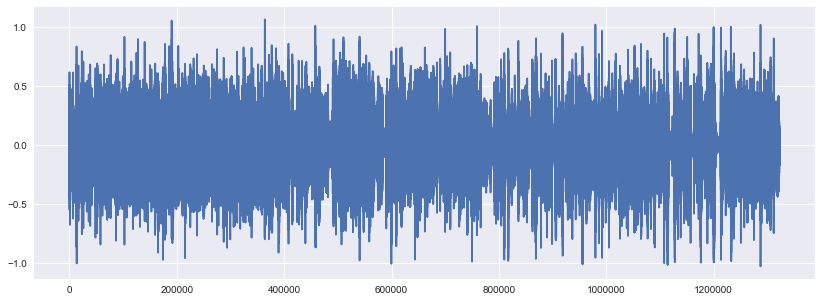

In [6]:
plt.plot(x1)

Play the audio file:

In [7]:
IPython.display.Audio(x1, rate=fs1)

## Step 2: Extract Features

For each segment, compute the MFCCs. Experiment with `n_mfcc` to select a different number of coefficients, e.g. 12.

In [8]:
librosa.feature.mfcc?

In [9]:
mfcc1 = librosa.feature.mfcc(x1, sr=fs1, n_mfcc=12).T

In [10]:
mfcc1.shape

(2584, 12)

Scale the features to have zero mean and unit variance:

In [11]:
scaler = sklearn.preprocessing.StandardScaler()

In [12]:
mfcc1_scaled = scaler.fit_transform(mfcc1)

Verify that the scaling worked:

In [13]:
mfcc1_scaled.mean(axis=0)

array([ -6.59946813e-17,  -2.41980498e-16,   2.06233379e-16,
        -5.49955678e-18,  -1.20990249e-16,   6.04951246e-17,
         0.00000000e+00,  -3.27223628e-16,   1.64986703e-17,
         2.19982271e-17,   1.56737368e-16,  -5.49955678e-17])

In [14]:
mfcc1_scaled.std(axis=0)

array([ 1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.])

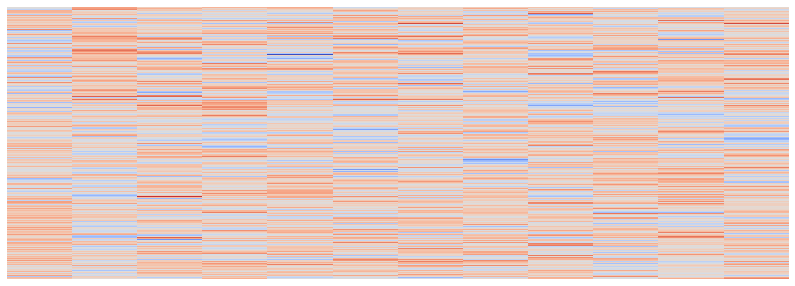

In [15]:

librosa.display.specshow(mfcc1_scaled)

**Repeat steps 1 and 2 for another audio file:**

In [16]:
filename2 = 'busta_rhymes_hits_for_days.mp3'
url = "http://audio.musicinformationretrieval.com/" + filename2
filename2 = '/Users/narayan/Music/Dance Music/Jathiswaram/06 JATHISWARAM 6.mp3'

In [17]:
if not os.path.exists(filename2):
    urllib.request.urlretrieve(url, filename=filename2)

Load 120 seconds of an audio file:

In [18]:
x2, fs2 = librosa.load(filename2, offset=120, duration=120)

Listen to the second audio file.

In [19]:
IPython.display.Audio(x2, rate=fs2)

Plot the time-domain waveform and spectrogram of the second audio file. In what ways does the time-domain waveform look different than the first audio file? What differences in musical attributes might this reflect? What additional insights are gained from plotting the spectrogram? **Explain.**

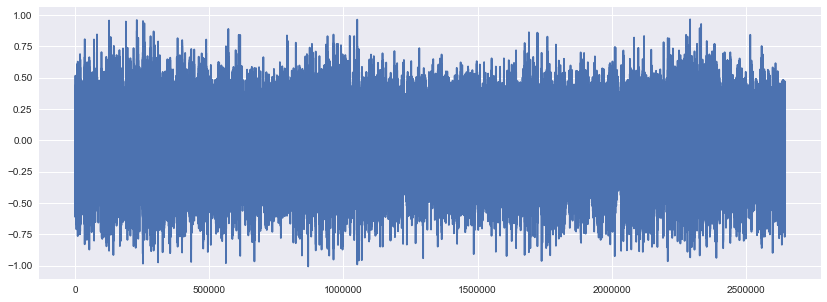

In [20]:
plt.plot(x2)

In [21]:
# See http://musicinformationretrieval.com/stft.html for more details on displaying spectrograms.
librosa.feature.melspectrogram?
S2 = librosa.feature.melspectrogram(x2, sr=fs2, n_fft=1024)

In [22]:
librosa.logamplitude?
logS2 = librosa.logamplitude(S2)

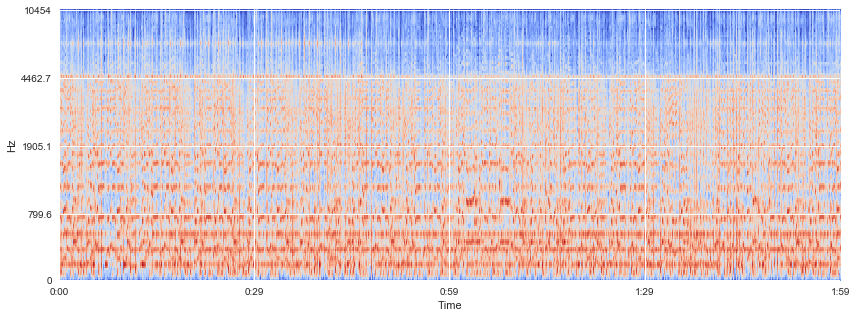

In [23]:
librosa.display.specshow?
librosa.display.specshow(logS2, sr=fs2, x_axis='time', y_axis='mel')

**[Please share your answer in this editable text cell.]**

Extract MFCCs from the second audio file. Be sure to transpose the resulting matrix such that each row is one observation, i.e. one set of MFCCs. Also be sure that the shape and size of the resulting MFCC matrix is equivalent to that for the first audio file.

In [24]:
librosa.feature.mfcc?
mfcc2 = librosa.feature.mfcc(x2, sr=fs2, n_mfcc=12).T

In [25]:
mfcc2.shape

(5168, 12)

Scale the resulting MFCC features to have approximately zero mean and unit variance. Re-use the scaler from above.

In [26]:
scaler.transform?
mfcc2_scaled = scaler.fit_transform(mfcc2)

Verify that the mean of the MFCCs for the second audio file is approximately equal to zero and the variance is approximately equal to one.

In [27]:
mfcc2_scaled.mean(axis=0)

array([  7.69937949e-17,   3.95968088e-16,   9.89920220e-17,
         1.48488033e-16,  -2.08983158e-16,  -7.69937949e-17,
        -8.79929085e-17,  -9.89920220e-17,   1.09991136e-17,
        -6.59946813e-17,  -9.07426868e-17,   1.64986703e-16])

In [28]:
mfcc2_scaled.std(axis=0)

array([ 1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.])

## Step 3: Train a Classifier

Concatenate all of the scaled feature vectors into one feature table.

In [29]:
features = numpy.vstack((mfcc1_scaled, mfcc2_scaled))

In [30]:
features.shape

(7752, 12)

Construct a vector of ground-truth labels, where 0 refers to the first audio file, and 1 refers to the second audio file.

In [31]:
labels = numpy.concatenate((numpy.zeros(len(mfcc1_scaled)), numpy.ones(len(mfcc2_scaled))))

Create a classifer model object:

In [32]:
# Support Vector Machine
model = sklearn.neighbors.KNeighborsClassifier(n_neighbors=5)

Train the classifier:

In [33]:
model.fit(features, labels)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
           metric_params=None, n_jobs=1, n_neighbors=5, p=2,
           weights='uniform')

In [34]:
# Your code here

## Step 4: Run the Classifier

To test the classifier, we will extract an unused 10-second segment from the earlier audio fields as test excerpts:

In [67]:
x1_test, fs1 = librosa.load(filename1, duration=10, offset=200)

In [71]:
x2_test, fs2 = librosa.load(filename2, duration=10, offset=240)

Listen to both of the test audio excerpts:

In [69]:
IPython.display.Audio(x1_test, rate=fs1)

In [72]:
IPython.display.Audio(x2_test, rate=fs2)

Compute MFCCs from both of the test audio excerpts:

In [73]:
mfcc_test1 = librosa.feature.mfcc(x1_test, sr=fs1, n_mfcc=12).T

In [74]:
mfcc_test2 = librosa.feature.mfcc(x2_test, sr=fs2, n_mfcc=12).T

Scale the MFCCs using the previous scaler:

In [75]:
mfcc_test1_scaled = scaler.fit_transform(mfcc_test1)

In [76]:
mfcc_test2_scaled = scaler.fit_transform(mfcc_test2)

Concatenate all test features together:

In [77]:
test_features = numpy.vstack((mfcc_test1_scaled, mfcc_test2_scaled))

Concatenate all test labels together:

In [78]:
test_labels = numpy.concatenate((numpy.zeros(len(mfcc_test1_scaled)), numpy.ones(len(mfcc_test2_scaled))))

Compute the predicted labels:

In [80]:
test_result = model.predict(test_features)
test_result

array([ 1.,  1.,  0.,  0.,  1.,  1.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,
        0.,  0.,  0.,  1.,  1.,  1.,  0.,  0.,  0.,  1.,  1.,  1.,  1.,
        1.,  1.,  1.,  0.,  0.,  0.,  1.,  0.,  0.,  1.,  1.,  1.,  1.,
        1.,  0.,  0.,  0.,  0.,  1.,  0.,  0.,  0.,  0.,  1.,  1.,  1.,
        1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,  0.,  0.,  0.,
        1.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
        0.,  1.,  0.,  0.,  0.,  1.,  1.,  0.,  1.,  0.,  1.,  0.,  0.,
        0.,  0.,  0.,  0.,  0.,  1.,  1.,  0.,  1.,  1.,  0.,  0.,  0.,
        0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
        0.,  0.,  0.,  0.,  0.,  0.,  1.,  1.,  0.,  1.,  1.,  0.,  0.,
        1.,  1.,  1.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,
        1.,  1.,  0.,  0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
        0.,  1.,  1.,  0.,  1.,  1.,  1.,  0.,  1.,  1.,  0.,  1.,  0.,
        1.,  1.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0

Finally, compute the accuracy score of the classifier on the test data:

In [81]:
score = model.score(mfcc_test1_scaled, numpy.zeros(len(mfcc_test1_scaled)))

In [82]:
score

0.57540603248259858

In [83]:
test_result.shape

(862,)

Currently, the classifier returns one prediction for every MFCC vector in the test audio signal. Can you modify the procedure above such that the classifier returns a single prediction for a 10-second excerpt?

In [84]:
test_result = model.predict(test_features)# Your code here.

**Am simply splitting the test resum**

In [85]:
test1, test2 = numpy.split(test_result, 2)

In [86]:
from scipy import stats
stats.mode(test1).mode[0], stats.mode(test1).count[0]/len(test1)

(0.0, 0.57540603248259858)

In [87]:
stats.mode(test2).mode[0], stats.mode(test2).count[0]/len(test2)

(1.0, 0.85382830626450112)

## Step 5: Analysis in Pandas

Read the MFCC features from the first test audio excerpt into a data frame:

In [88]:
df1 = pandas.DataFrame(mfcc_test1_scaled)

In [89]:
df1.shape

(431, 12)

In [90]:
df1.head()

,0,1,2,3,4,5,6,7,8,9,10,11
0,0.412668,1.161940,-1.272113,0.243142,-0.148742,-0.220869,0.425940,-0.077235,3.077910,-0.234150,1.391412,0.795686
1,0.595693,0.407001,-1.466827,0.404903,0.311059,-0.544536,0.120051,-0.107501,2.876501,0.001494,0.888176,0.971270
2,0.303435,-0.322045,-0.983230,0.851206,0.824318,-0.083661,-0.330880,-1.044885,1.998333,0.463686,1.110307,0.970787
3,1.079503,-0.018453,-0.579849,-0.282240,1.082628,0.032883,-1.525363,-0.046050,0.075622,0.937067,1.102098,1.716565
4,1.317557,0.141557,-0.868839,-0.557675,1.584957,-0.214742,-2.037785,0.576838,-0.089627,0.522526,0.877710,2.137129


In [91]:
df2 = pandas.DataFrame(mfcc_test2_scaled)

Compute the pairwise correlation of every pair of 12 MFCCs against one another for both test audio excerpts. For each audio excerpt, which pair of MFCCs are the most correlated? least correlated?

In [92]:
df1.corr()

,0,1,2,3,4,5,6,7,8,9,10,11
0,1.000000,-0.238719,-0.119386,-0.291420,0.138953,0.185036,-0.137792,0.197740,0.335469,0.012961,-0.061017,0.046379
1,-0.238719,1.000000,0.227289,0.198797,0.060156,0.264718,0.076416,0.159303,-0.192990,0.197275,0.072205,-0.132903
2,-0.119386,0.227289,1.000000,0.350550,0.365309,0.189406,0.102034,0.174282,-0.315612,0.005971,0.071577,0.040489
3,-0.291420,0.198797,0.350550,1.000000,0.322247,-0.060535,0.229918,0.082419,0.189659,-0.105057,-0.035437,0.383608
4,0.138953,0.060156,0.365309,0.322247,1.000000,-0.027233,-0.267596,0.318024,0.066554,-0.094550,0.193840,0.194231
5,0.185036,0.264718,0.189406,-0.060535,-0.027233,1.000000,0.162061,0.155740,-0.045881,0.457262,-0.004598,-0.098828
6,-0.137792,0.076416,0.102034,0.229918,-0.267596,0.162061,1.000000,-0.239767,0.160166,0.121046,-0.224051,0.096542
7,0.197740,0.159303,0.174282,0.082419,0.318024,0.155740,-0.239767,1.000000,0.184078,0.054088,0.162568,-0.200506
8,0.335469,-0.192990,-0.315612,0.189659,0.066554,-0.045881,0.160166,0.184078,1.000000,0.087527,-0.024126,0.128748
9,0.012961,0.197275,0.005971,-0.105057,-0.094550,0.457262,0.121046,0.054088,0.087527,1.000000,0.108096,-0.100396


In [93]:
df2.corr()

,0,1,2,3,4,5,6,7,8,9,10,11
0,1.000000,-0.223350,-0.059395,-0.312037,-0.010177,0.070726,-0.090820,0.270382,-0.056913,-0.082894,0.091514,0.059125
1,-0.223350,1.000000,0.278089,0.255734,0.077828,0.166735,0.180421,0.157631,0.266214,0.128645,0.103393,0.133275
2,-0.059395,0.278089,1.000000,0.082698,0.348612,0.503245,0.317796,0.331825,0.140083,0.263089,0.198497,0.153691
3,-0.312037,0.255734,0.082698,1.000000,0.028623,-0.035288,0.167106,0.059658,0.115424,0.268869,-0.013305,0.034804
4,-0.010177,0.077828,0.348612,0.028623,1.000000,0.161559,0.153485,0.045038,0.144417,0.235994,0.077240,0.026064
5,0.070726,0.166735,0.503245,-0.035288,0.161559,1.000000,0.215611,0.193250,0.046236,0.200488,0.262633,0.187301
6,-0.090820,0.180421,0.317796,0.167106,0.153485,0.215611,1.000000,0.147142,0.075882,0.117181,0.174173,0.307923
7,0.270382,0.157631,0.331825,0.059658,0.045038,0.193250,0.147142,1.000000,0.076966,-0.092855,-0.064922,0.027236
8,-0.056913,0.266214,0.140083,0.115424,0.144417,0.046236,0.075882,0.076966,1.000000,0.109498,-0.151175,0.029035
9,-0.082894,0.128645,0.263089,0.268869,0.235994,0.200488,0.117181,-0.092855,0.109498,1.000000,0.537918,0.199204


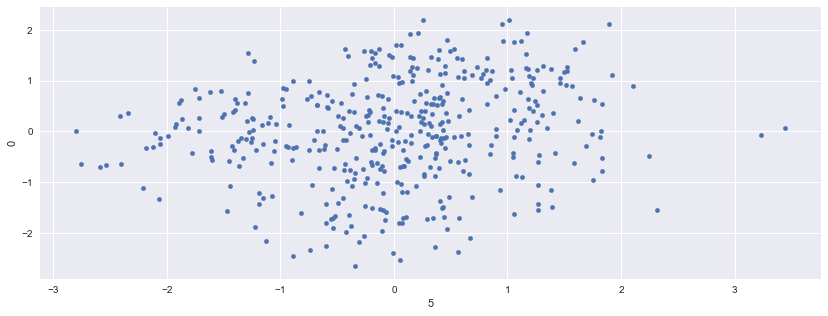

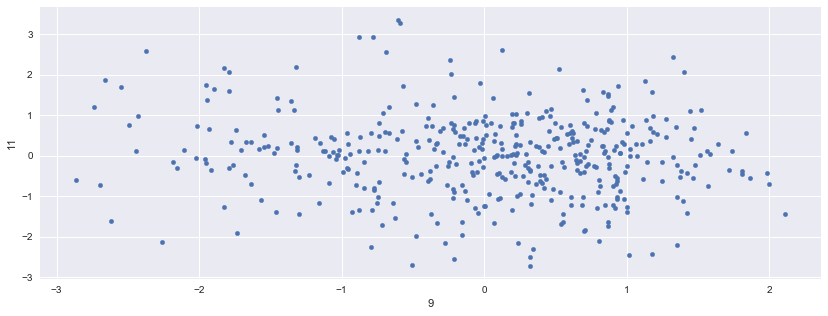

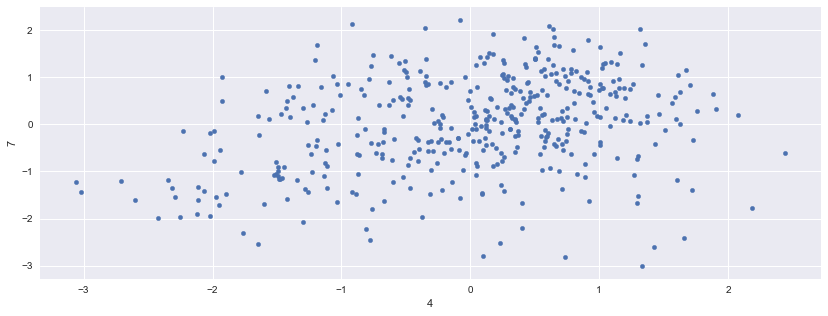

In [94]:
df1.plot.scatter(5,0)
df1.plot.scatter(9,11)
df1.plot.scatter(4,7)

**[Explain your answer in this editable text cell.]**

Display a scatter plot of any two of the MFCC dimensions (i.e. columns of the data frame) against one another. Try for multiple pairs of MFCC dimensions.

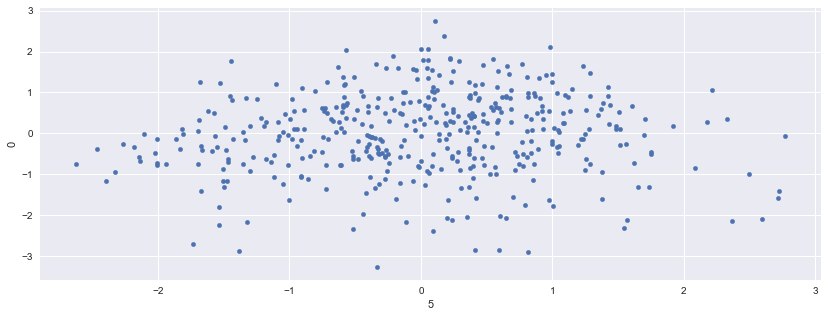

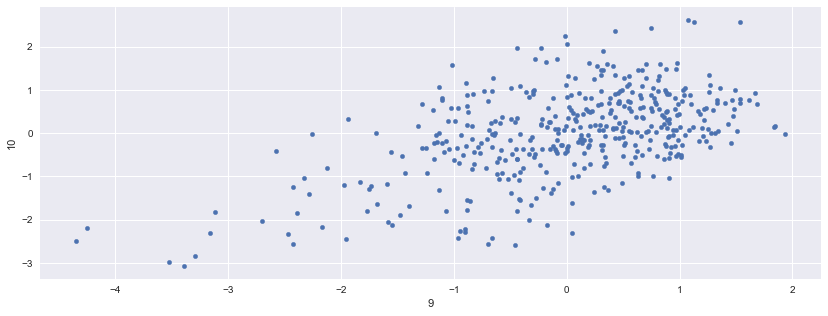

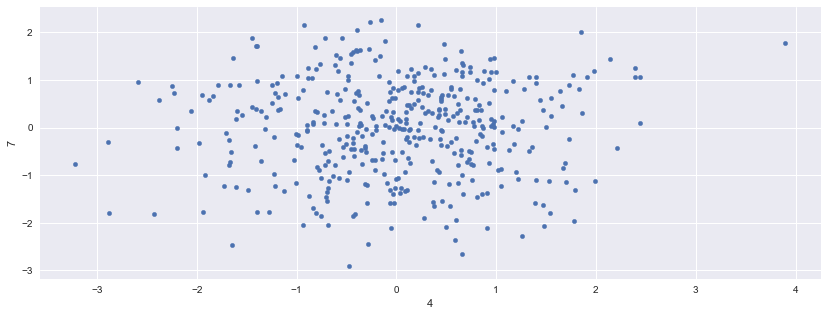

In [95]:
df2.plot.scatter(5,0)
df2.plot.scatter(9,10)
df2.plot.scatter(4,7)

Display a scatter plot of any two of the MFCC dimensions (i.e. columns of the data frame) against one another. Try for multiple pairs of MFCC dimensions.

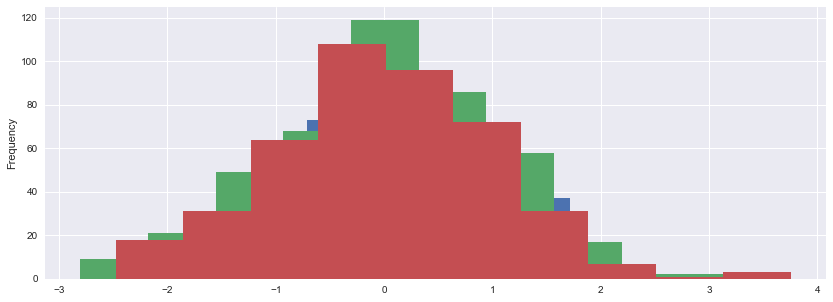

In [96]:
df1[0].plot.hist()
df1[5].plot.hist()
df1[10].plot.hist()

Plot a histogram of all values across a single MFCC, i.e. MFCC coefficient number. Repeat for a few different MFCC numbers:

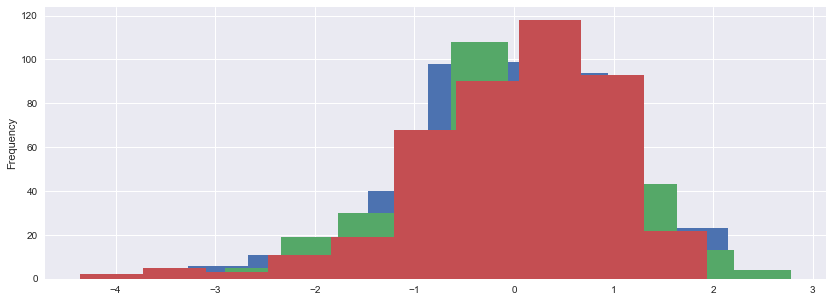

In [97]:
df2[0].plot.hist()
df2[3].plot.hist()
df2[9].plot.hist()

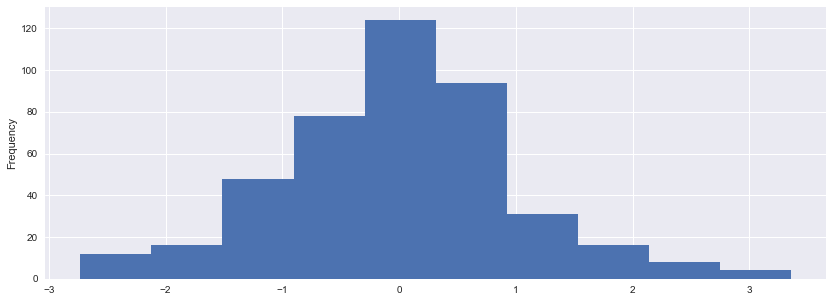

In [98]:
df1[11].plot.hist()

## Extra Credit

Create a new genre classifier by repeating the steps above, but this time use training data and test data from your own audio collection representing two or more different genres. For what genres and audio data styles does the classifier work well, and for which (pairs of) genres does the classifier fail?

Create a new genre classifier by repeating the steps above, but this time use a different machine learning classifier, e.g. random forest, Gaussian mixture model, Naive Bayes, k-nearest neighbor, etc. Adjust the parameters. How well do they perform?

Create a new genre classifier by repeating the steps above, but this time use different features. Consult the [librosa documentation on feature extraction](http://librosa.github.io/librosa/feature.html) for different choices of features. Which features work well? not well?